# Digital Image Processing
## Homework 5
## Student Name: Amirmehdi Jafari Fesharaki
## Student ID: 98109645

------

## 1. Image Compression

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2 as cv

In [2]:
im_orig = np.array(Image.open("q1.jpg")).astype("double")

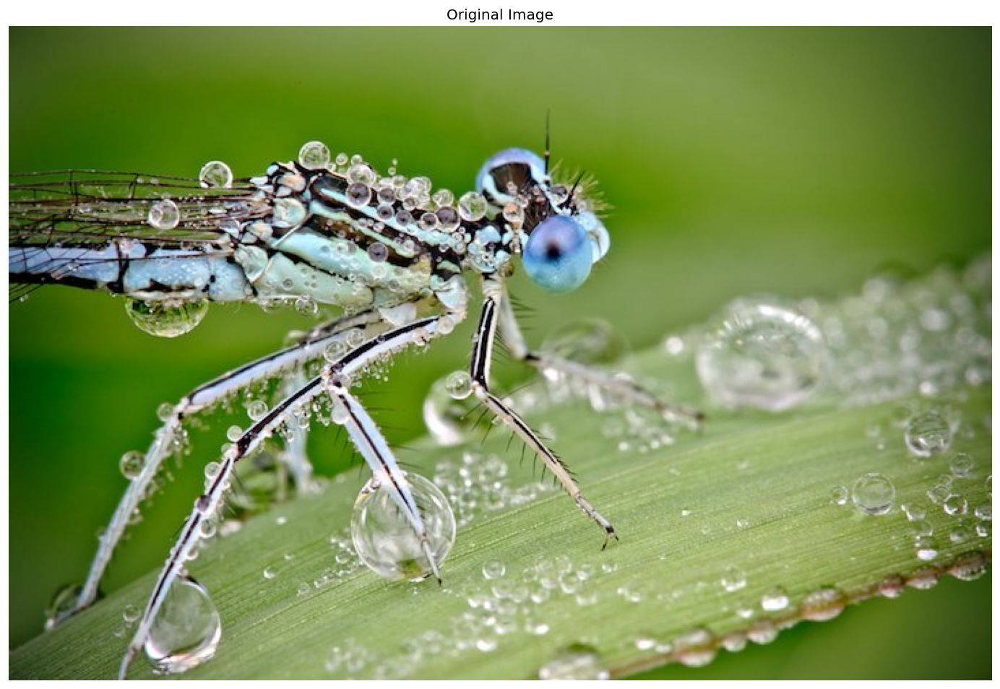

In [3]:
plt.figure(dpi=120,figsize=(15,10))
plt.imshow(im_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")
plt.show()

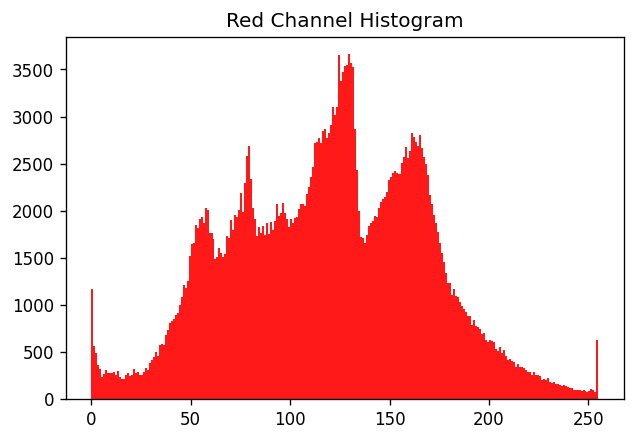

In [4]:
im_r = im_orig[:,:,0]
im_g = im_orig[:,:,1]
im_b = im_orig[:,:,2]

plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_r.flatten(), bins=255, color="r", alpha=0.9)
plt.title("Red Channel Histogram")
plt.savefig("Results/hist_r.jpg")
plt.show()

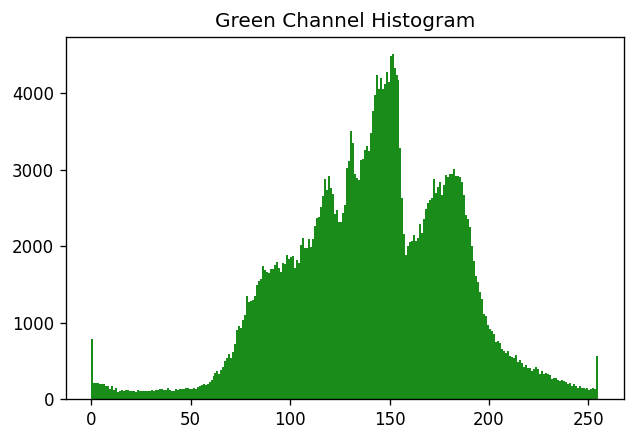

In [5]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_g.flatten(), bins=255, color="g", alpha=0.9)
plt.title("Green Channel Histogram")
plt.savefig("Results/hist_g.jpg")
plt.show()

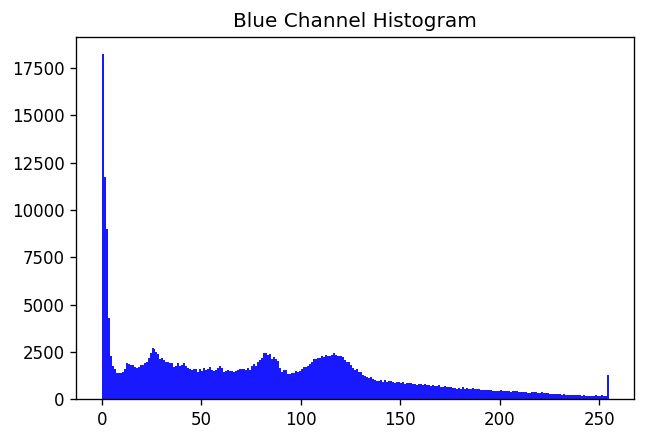

In [6]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_b.flatten(), bins=255, color="b", alpha=0.9)
plt.title("Blue Channel Histogram")
plt.savefig("Results/hist_b.jpg")
plt.show()

In [7]:
q_const = 4

im_r_clus = (im_r // q_const) * q_const 
im_g_clus = (im_g // q_const) * q_const 
im_b_clus = (im_b // q_const) * q_const 



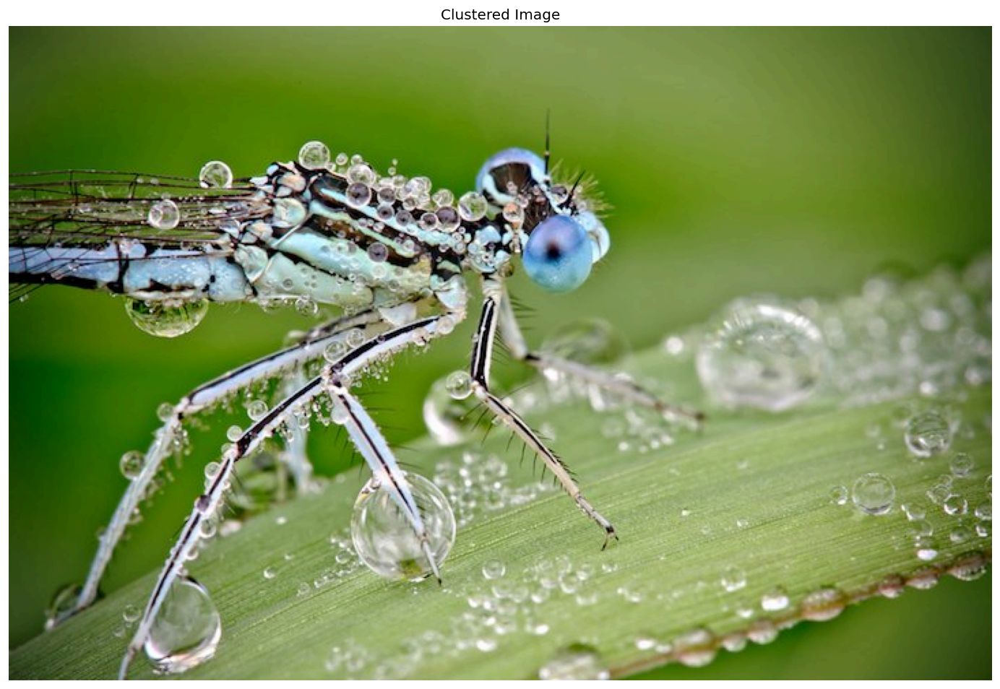

In [8]:
im_clus = np.dstack((im_r_clus, im_g_clus, im_b_clus))
Image.fromarray(im_clus.astype("uint8")).save("Results/clustered.jpg", "JPEG")
plt.figure(dpi=120,figsize=(15,10))
plt.imshow(im_clus.astype("uint8"))
plt.axis("off")
plt.title("Clustered Image")
plt.show()

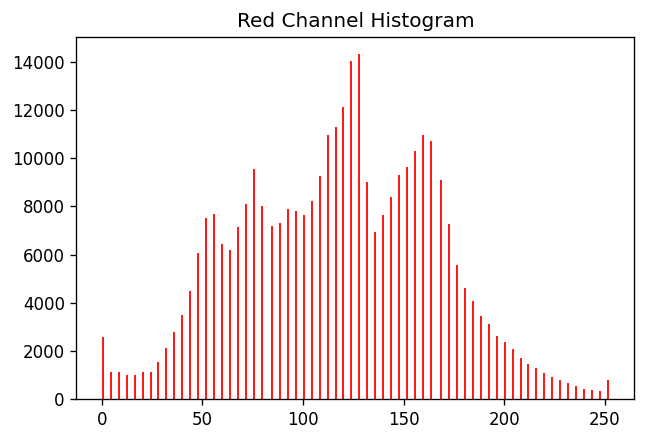

In [9]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_r_clus.flatten(), bins=255, color="r", alpha=0.9)
plt.title("Red Channel Histogram")
plt.savefig("Results/hist_r_clus.jpg")
plt.show()

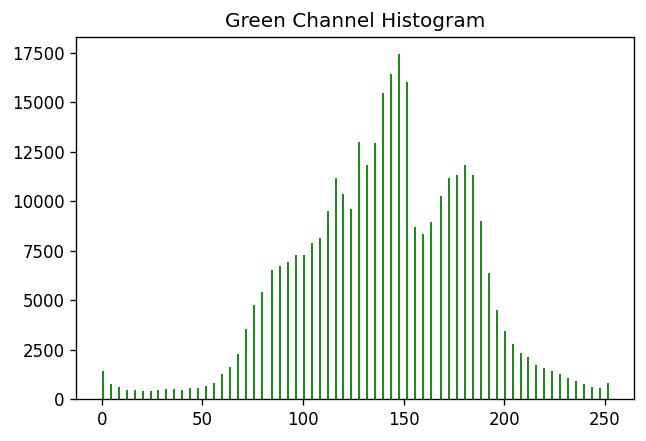

In [10]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_g_clus.flatten(), bins=255, color="g", alpha=0.9)
plt.title("Green Channel Histogram")
plt.savefig("Results/hist_g_clus.jpg")
plt.show()

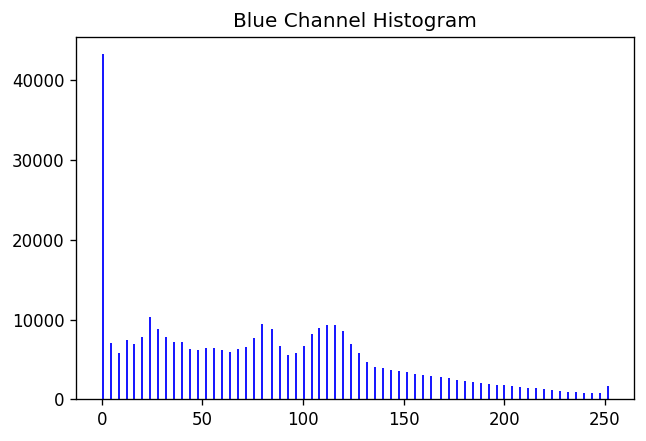

In [11]:
plt.figure(dpi=120,figsize=(6,4))
plt.hist(im_b_clus.flatten(), bins=255, color="b", alpha=0.9)
plt.title("Blue Channel Histogram")
plt.savefig("Results/hist_b_clus.jpg")
plt.show()

<p style="color: red"> MENTION THE RESULTS AND THE REASON BEHIND IT. MENTION THE OPTIMAL VALUE FOR QUANTIZATION AS WELL</p>

----
## 2. Dynamic Programming

In [12]:
import scipy.ndimage as ndimage
import cv2 as cv

In [13]:
def scale_image(im):
    im_scaled = (im - im.min())/(im.max() - im.min()) * 255
    return im_scaled

In [14]:
# loading images
im1 = np.array(Image.open("q2_0.jpg")).astype("double")
im2 = np.array(Image.open("q2_1.jpg")).astype("double")

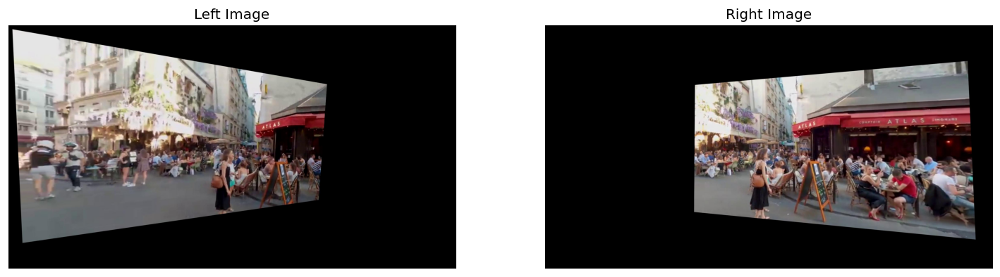

In [15]:
# plotting
plt.figure(dpi=120, figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(im1.astype("uint8"))
plt.axis("off")
plt.title("Left Image")

plt.subplot(1,2,2)
plt.imshow(im2.astype("uint8"))
plt.axis("off")
plt.title("Right Image")

plt.show()

In [16]:
# cropping the images
N,M,_ = im1.shape
right_crop = 720
left_crop = 1560
right_cut = 660
left_cut = 740
left_border = right_crop + right_cut
right_border = left_cut - right_crop

# cropping the images in a way that they are dividable by 128 (in order to be able to downsampe and 
# upsampe without bugs)
im1_cropped = im1[:-48,:left_crop,:] 
im2_cropped = im2[:-48,right_crop:,:]

im_right = im2_cropped[:,right_cut:,:]
im_left = im1_cropped[:,:left_cut,:]

im1_overlap = im1_cropped[:,left_cut:left_border,:]
im2_overlap = im2_cropped[:,right_border:right_cut,:]
print(im1_overlap.shape)

(1152, 640, 3)


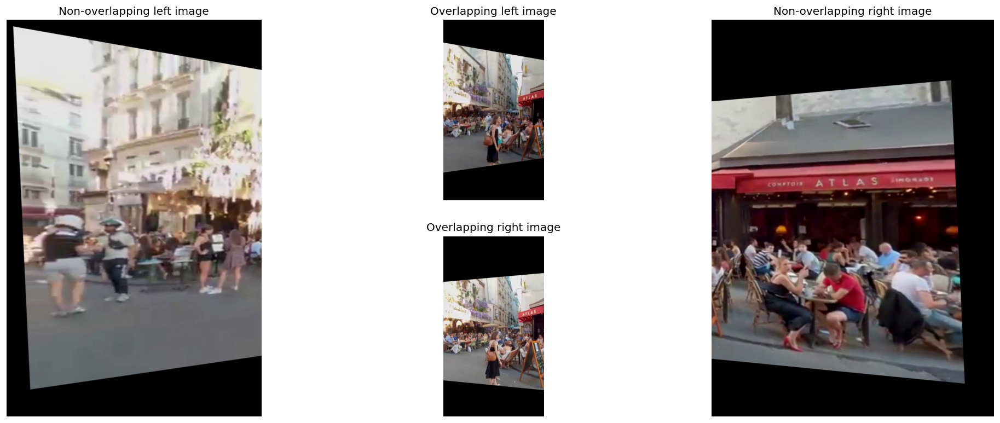

In [17]:
## plotting the parts
plt.figure(figsize=(20,8), dpi=120)
plt.subplot(1,3,1)
plt.imshow(im_left.astype("uint8"))
plt.title("Non-overlapping left image")
plt.axis("off")

plt.subplot(2,3,2)
plt.imshow(im1_overlap.astype("uint8"))
plt.title("Overlapping left image")
plt.axis("off")

plt.subplot(2,3,5)
plt.imshow(im2_overlap.astype("uint8"))
plt.title("Overlapping right image")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(im_right.astype("uint8"))
plt.title("Non-overlapping right image")
plt.axis("off")

plt.show()

Now we should merge the overlapping parts and then concatenate the three parts together.

In [18]:
def resize(im1, im_size):
    im=Image.fromarray(im1.astype("uint8")).resize(im_size)
    im_arr = np.array(im).astype("double")
    return im_arr

def color_gaussian(im, sigma):
    r_filt = ndimage.gaussian_filter(im[:,:,0], sigma)
    g_filt = ndimage.gaussian_filter(im[:,:,1], sigma)
    b_filt = ndimage.gaussian_filter(im[:,:,2], sigma)
    return np.dstack((r_filt, g_filt, b_filt))

def laplacianPyr(im,n,n_max):
    gaussian_pyr = im.copy()
    for i in range(1,n):
        gaussian_pyr = cv.pyrDown(gaussian_pyr)
    if (n==n_max):
        return gaussian_pyr
    next_gaussian_pyr = cv.pyrUp(cv.pyrDown(gaussian_pyr))
    laplacian_pyr = gaussian_pyr - next_gaussian_pyr
    return laplacian_pyr

In [19]:
def min_err_boundary_cut(cost_arr):
    N, M = cost_arr.shape
    costs = np.zeros(cost_arr.shape)
    path_arr = np.zeros(cost_arr.shape)
    for i in range(1, N):
        for j in range(M):
            min_cost = 10000000
            for k in [j, max(j-1, 0), min(j+1, M-1)]:
                if (costs[i-1, k] < min_cost):
                    min_cost = costs[i-1, k]
                    path_arr[i,j] = k
            costs[i,j] = min_cost + cost_arr[i,j]
    min_inds = np.where(costs[-1,:] == costs[-1,:].min())
    min_ind = int(min_inds[0][min_inds[0].shape[0]//2]) # the value in the middle
    path = [min_ind]
    for i in range(cost_arr.shape[0]-1,0,-1):
        min_ind = int(path_arr[i,min_ind])
        path.insert(0,min_ind)
    return path

In [20]:
cost_arr = (im1_overlap - im2_overlap)
cost_arr = cost_arr[:,:,0]**2 + cost_arr[:,:,1]**2 + cost_arr[:,:,2]**2
error_boundary_path = min_err_boundary_cut(cost_arr)
mask = np.zeros(im1_overlap.shape)
for i in range(0, im1_overlap.shape[0]):
    for j in range(im1_overlap.shape[1]):
        if (j<=error_boundary_path[i]):
            mask[i,j] = 1

Image.fromarray(scale_image(mask).astype("uint8")).save("Results/boarder.jpg")

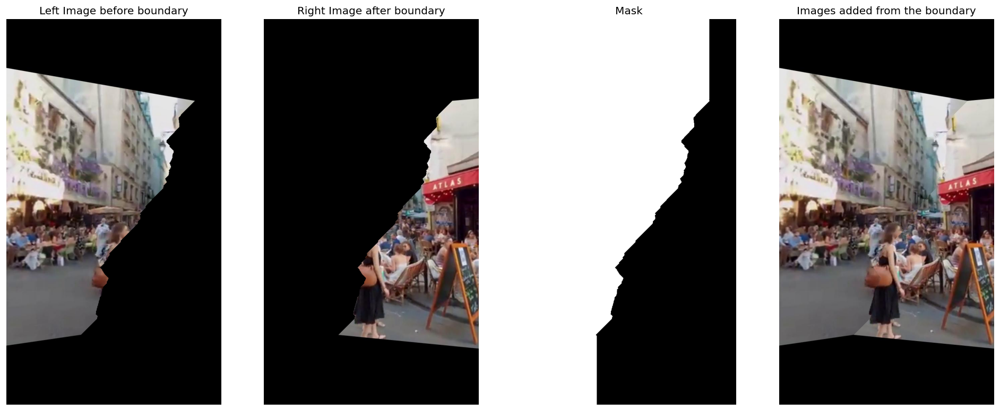

In [21]:
plt.figure(figsize=(20,30), dpi=120)
plt.subplot(1,4,1)
plt.imshow((mask * im1_overlap).astype("uint8"))
plt.axis("off")
plt.title("Left Image before boundary")

plt.subplot(1,4,3)
plt.imshow(mask)
plt.axis("off")
plt.title("Mask")

plt.subplot(1,4,2)
plt.imshow(((1-mask) * im2_overlap).astype("uint8"))
plt.axis("off") 
plt.title("Right Image after boundary")

plt.subplot(1,4,4)
plt.imshow((mask * im1_overlap + (1-mask) * im2_overlap).astype("uint8"))
plt.axis("off")
plt.title("Images added from the boundary")

plt.show()

In [22]:
# creating a full mask for the whole image
mask_final = np.zeros((mask.shape[0], im_left.shape[1] + mask.shape[1] + im_right.shape[1]))
for i in range(0, mask_final.shape[0]):
    for j in range(mask_final.shape[1]):
        if (j - im_left.shape[1]<=error_boundary_path[i]):
            mask_final[i,j] = 1

In [23]:
# concatenating the non-overlapping and overlapping parts of left image 
#+ zero padding (to avoid error in up/down sample)
im1_concate = np.hstack((im_left, im1_overlap, np.zeros(im_right.shape)))
im1_concate = np.hstack((im1_concate, np.zeros((im1_concate.shape[0], 
                                                int((im1_concate.shape[1]//128 + 1) * 128 - im1_concate.shape[1]),
                                                3))))

# concatenating the non-overlapping and overlapping parts of right image 
#+ zero padding (to avoid error in up/down sample)
im2_concate = np.hstack((np.zeros(im_left.shape), im2_overlap, im_right))
im2_concate = np.hstack((im2_concate, np.zeros((im2_concate.shape[0], 
                                                int((im2_concate.shape[1]//128 + 1) * 128 - im2_concate.shape[1]),
                                                3))))

# zero padding mask (to avoid error in up/down sample)
mask_concate = np.hstack((mask_final, np.zeros((mask_final.shape[0],
                                                int((mask_final.shape[1]//128 + 1) * 128 - mask_final.shape[1])))))

# blending the images using the created mask and laplacian pyramid
im_overlap_final = np.zeros((int(im1_concate.shape[0]//2**7), int(im1_concate.shape[1]//2**7), 3))
for i in range(8,0,-1):
    laplacian_1 = laplacianPyr(im1_concate, i, 8)
    laplacian_2 = laplacianPyr(im2_concate, i, 8)
    gaussian_mask = mask_concate.copy()
    for j in range(1,i):
        gaussian_mask = cv.pyrDown(gaussian_mask)
    gaussian_mask = (gaussian_mask - gaussian_mask.min())/ (gaussian_mask.max() - gaussian_mask.min())
    gaussian_mask = np.dstack((gaussian_mask, gaussian_mask, gaussian_mask))
    laplacian_merge = (laplacian_1 * gaussian_mask + laplacian_2 * (1 - gaussian_mask))
    im_overlap_final = im_overlap_final + laplacian_merge
    if (i!=1):
        im_overlap_final = cv.pyrUp(im_overlap_final)
        
# removing the zero padding
im_merged = scale_image(im_overlap_final[:,:mask_final.shape[1]]).astype("uint8")
Image.fromarray(im_merged).save("Results/res_q2.jpg")

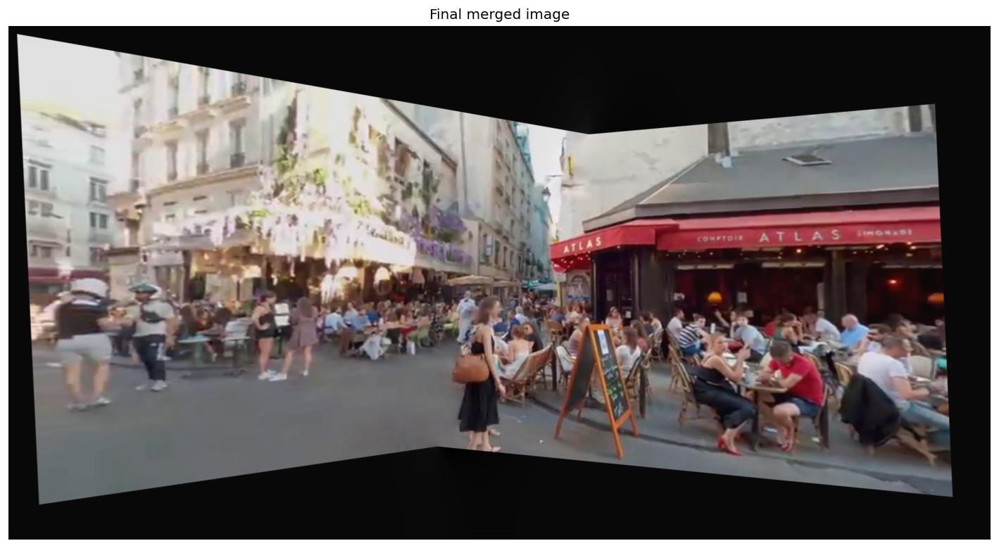

In [24]:
## plotting the final merged image
plt.figure(figsize=(15,10), dpi=120)
plt.imshow(im_merged)
plt.axis("off")
plt.title("Final merged image")
plt.show()

---
## 3. Wavelet

In [25]:
import pywt

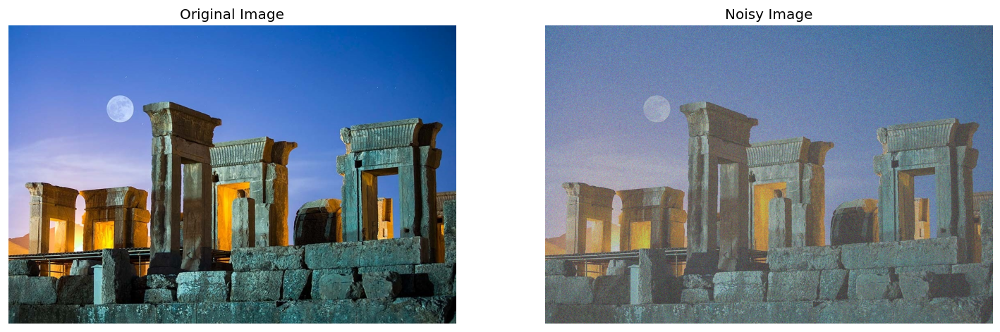

In [26]:
# loading image
im3_orig = np.array(Image.open("Q3.jpg")).astype("double")
noise_std = 30
im3_noisy = im3_orig + np.random.normal(loc=0, scale=noise_std, size=im3_orig.shape)

plt.figure(dpi=120,figsize=(15,10))
plt.subplot(1,2,1)
plt.imshow(im3_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")

plt.subplot(1,2,2)
plt.imshow(scale_image(im3_noisy).astype("uint8"))
plt.axis("off")
plt.title("Noisy Image")

plt.show()

### 3.1.

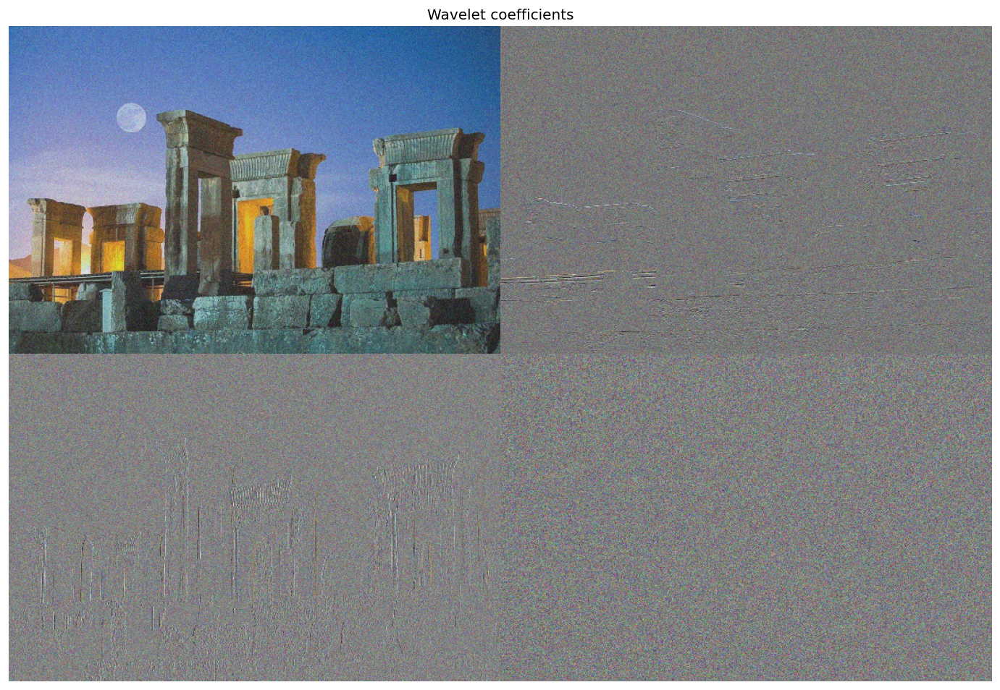

In [27]:
# wavelet image
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
coeffs2_r = pywt.dwt2(im3_noisy[:,:,0], 'haar')
coeffs2_g = pywt.dwt2(im3_noisy[:,:,1], 'haar')
coeffs2_b = pywt.dwt2(im3_noisy[:,:,2], 'haar')
LL_r, (LH_r, HL_r, HH_r) = coeffs2_r
LL_g, (LH_g, HL_g, HH_g) = coeffs2_g
LL_b, (LH_b, HL_b, HH_b) = coeffs2_b

# concatenating the coefficients to show in one image
LL = np.dstack((LL_r, LL_g, LL_b))
LH = np.dstack((LH_r, LH_g, LH_b))
HL = np.dstack((HL_r, HL_g, HL_b))
HH = np.dstack((HH_r, HH_g, HH_b))

im_wt = np.vstack((np.hstack((scale_image(LL), scale_image(LH))),np.hstack((scale_image(HL), scale_image(HH)))))
plt.figure(dpi=120, figsize=(15,10))
plt.imshow(im_wt.astype("uint8"))
plt.axis("off")
plt.title("Wavelet coefficients")
plt.show()

### 3.2.

In [28]:
def hard_thresholding(LL, LH, HL, HH, thresh_LH, thresh_HL, thresh_HH):
    '''Gets the LL, LH, HL, and HH as input and returns the hard thresholded image.'''
    
    LL_r, LL_g, LL_b = LL[:,:,0], LL[:,:,1], LL[:,:,2]
    LH_r, LH_g, LH_b = LH[:,:,0], LH[:,:,1], LH[:,:,2]
    HL_r, HL_g, HL_b = HL[:,:,0], HL[:,:,1], HL[:,:,2]
    HH_r, HH_g, HH_b = HH[:,:,0], HH[:,:,1], HH[:,:,2]
    
    # thresholding    
    LH_r[np.abs(LH_r) < thresh_LH[0]] = 0
    LH_g[np.abs(LH_g) < thresh_LH[1]] = 0
    LH_b[np.abs(LH_b) < thresh_LH[2]] = 0
    
    HL_r[np.abs(HL_r) < thresh_HL[0]] = 0
    HL_g[np.abs(HL_g) < thresh_HL[1]] = 0
    HL_b[np.abs(HL_b) < thresh_HL[2]] = 0
    
    HH_r[np.abs(HH_r) < thresh_HH[0]] = 0
    HH_g[np.abs(HH_g) < thresh_HH[1]] = 0
    HH_b[np.abs(HH_b) < thresh_HH[2]] = 0
    
    im_r = pywt.idwt2((LL_r, (LH_r, HL_r, HH_r)), "haar")
    im_g = pywt.idwt2((LL_g, (LH_g, HL_g, HH_g)), "haar")
    im_b = pywt.idwt2((LL_b, (LH_b, HL_b, HH_b)), "haar")
    
    im = scale_image(np.dstack((im_r, im_g, im_b)))
    
    return im

def soft_thresholding(LL, LH, HL, HH, thresh_LH, thresh_HL, thresh_HH):
    '''Gets the LL, LH, HL, and HH as input and returns the soft thresholded image.'''
    
    LL_r, LL_g, LL_b = LL[:,:,0], LL[:,:,1], LL[:,:,2]
    LH_r, LH_g, LH_b = LH[:,:,0], LH[:,:,1], LH[:,:,2]
    HL_r, HL_g, HL_b = HL[:,:,0], HL[:,:,1], HL[:,:,2]
    HH_r, HH_g, HH_b = HH[:,:,0], HH[:,:,1], HH[:,:,2]
    
    # thresholding    
    LH_r[np.abs(LH_r) < thresh_LH[0]] = 0
    LH_g[np.abs(LH_g) < thresh_LH[1]] = 0
    LH_b[np.abs(LH_b) < thresh_LH[2]] = 0
    
    HL_r[np.abs(HL_r) < thresh_HL[0]] = 0
    HL_g[np.abs(HL_g) < thresh_HL[1]] = 0
    HL_b[np.abs(HL_b) < thresh_HL[2]] = 0
    
    HH_r[np.abs(HH_r) < thresh_HH[0]] = 0
    HH_g[np.abs(HH_g) < thresh_HH[1]] = 0
    HH_b[np.abs(HH_b) < thresh_HH[2]] = 0
    
    LH_r[LH_r >= thresh_LH[0]] = LH_r[LH_r >= thresh_LH[0]] - thresh_LH[0]
    LH_g[LH_g >= thresh_LH[1]] = LH_g[LH_g >= thresh_LH[1]] - thresh_LH[1]
    LH_b[LH_b >= thresh_LH[2]] = LH_b[LH_b >= thresh_LH[2]] - thresh_LH[2]
    
    HL_r[HL_r >= thresh_HL[0]] = HL_r[HL_r >= thresh_HL[0]] - thresh_HL[0]
    HL_g[HL_g >= thresh_HL[1]] = HL_g[HL_g >= thresh_HL[1]] - thresh_HL[1]
    HL_b[HL_b >= thresh_HL[2]] = HL_b[HL_b >= thresh_HL[2]] - thresh_HL[2]
    
    HH_r[HH_r >= thresh_HH[0]] = HH_r[HH_r >= thresh_HH[0]] - thresh_HH[0]
    HH_g[HH_g >= thresh_HH[1]] = HH_g[HH_g >= thresh_HH[1]] - thresh_HH[1]
    HH_b[HH_b >= thresh_HH[2]] = HH_b[HH_b >= thresh_HH[2]] - thresh_HH[2]
    
    LH_r[LH_r <= -thresh_LH[0]] = LH_r[LH_r <= -thresh_LH[0]] + thresh_LH[0]
    LH_g[LH_g <= -thresh_LH[1]] = LH_g[LH_g <= -thresh_LH[1]] + thresh_LH[1]
    LH_b[LH_b <= -thresh_LH[2]] = LH_b[LH_b <= -thresh_LH[2]] + thresh_LH[2]
    
    HL_r[HL_r <= -thresh_HL[0]] = HL_r[HL_r <= -thresh_HL[0]] + thresh_HL[0]
    HL_g[HL_g <= -thresh_HL[1]] = HL_g[HL_g <= -thresh_HL[1]] + thresh_HL[1]
    HL_b[HL_b <= -thresh_HL[2]] = HL_b[HL_b <= -thresh_HL[2]] + thresh_HL[2]
    
    HH_r[HH_r <= -thresh_HH[0]] = HH_r[HH_r <= -thresh_HH[0]] + thresh_HH[0]
    HH_g[HH_g <= -thresh_HH[1]] = HH_g[HH_g <= -thresh_HH[1]] + thresh_HH[1]
    HH_b[HH_b <= -thresh_HH[2]] = HH_b[HH_b <= -thresh_HH[2]] + thresh_HH[2]
    
    im_r = pywt.idwt2((LL_r, (LH_r, HL_r, HH_r)), "haar")
    im_g = pywt.idwt2((LL_g, (LH_g, HL_g, HH_g)), "haar")
    im_b = pywt.idwt2((LL_b, (LH_b, HL_b, HH_b)), "haar")
    
    im = scale_image(np.dstack((im_r, im_g, im_b)))
    
    return im

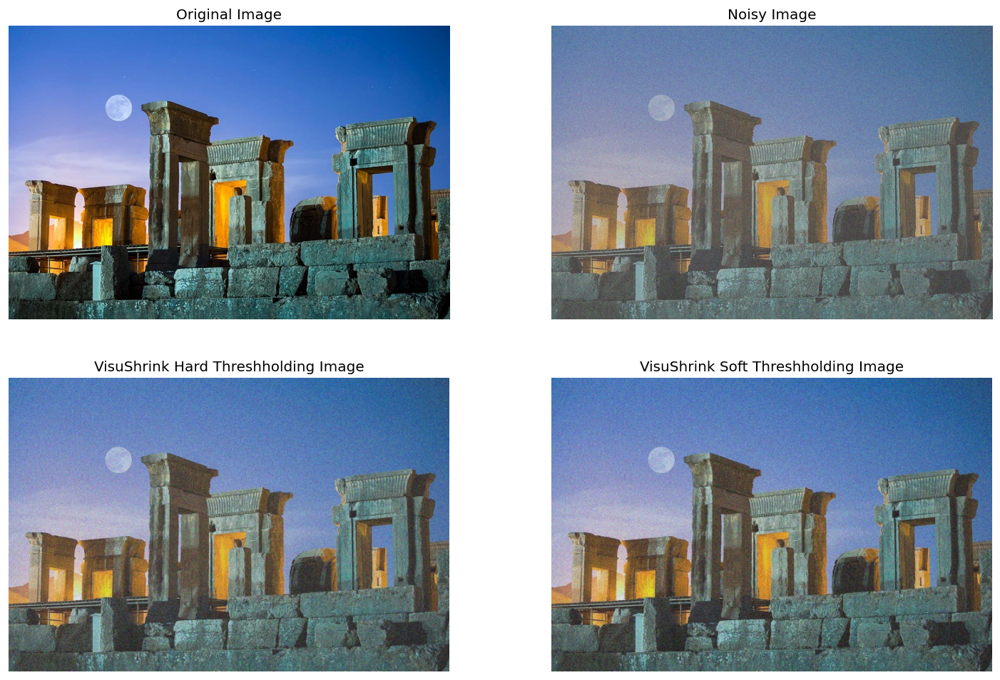

In [29]:
# finding the threshold using VisuShrink
thresh_visu = noise_std * np.sqrt(2 * np.log(im3_noisy.shape[0] * im3_noisy.shape[1]))
thresh_visu = np.array([thresh_visu, thresh_visu, thresh_visu])

# threshholding
im_visu_hard = hard_thresholding(LL, LH, HL, HH, thresh_visu, thresh_visu, thresh_visu)
im_visu_soft = soft_thresholding(LL, LH, HL, HH, thresh_visu, thresh_visu, thresh_visu)

# plotting
plt.figure(dpi=120,figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(im3_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")

plt.subplot(2,2,2)
plt.imshow(scale_image(im3_noisy).astype("uint8"))
plt.axis("off")
plt.title("Noisy Image")

plt.subplot(2,2,3)
plt.imshow(im_visu_hard.astype("uint8"))
plt.axis("off")
plt.title("VisuShrink Hard Threshholding Image")

plt.subplot(2,2,4)
plt.imshow(im_visu_soft.astype("uint8"))
plt.axis("off")
plt.title("VisuShrink Soft Threshholding Image")

plt.show()

### 3.3.

<ipython-input-30-567b3f2022d9>:10: RuntimeWarning: divide by zero encountered in true_divide
  thresh_LH_bayes = (noise_std**2) / std_LH
<ipython-input-30-567b3f2022d9>:11: RuntimeWarning: divide by zero encountered in true_divide
  thresh_HL_bayes = (noise_std**2) / std_HL
<ipython-input-30-567b3f2022d9>:12: RuntimeWarning: divide by zero encountered in true_divide
  thresh_HH_bayes = (noise_std**2) / std_HH


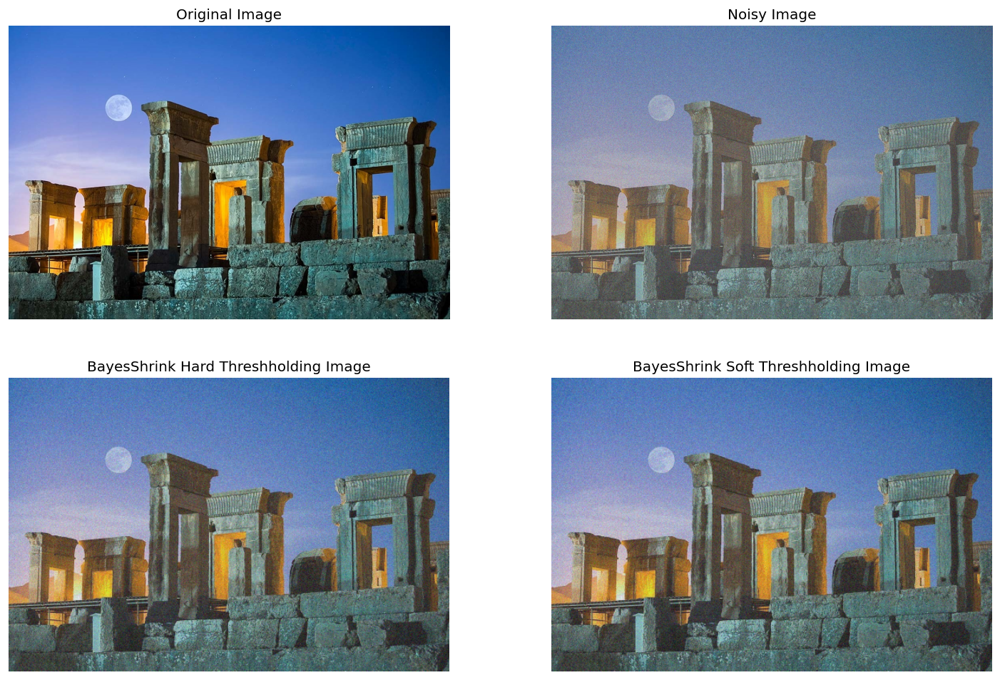

In [30]:
# finding the thresholds using BayesShrink
std_LH = np.std(LH, axis=(0,1))
std_HL = np.std(HL, axis=(0,1))
std_HH = np.std(HH, axis=(0,1))

std_LH = np.sqrt(np.max(np.array([std_LH - noise_std, [0,0,0]]), axis=0))
std_HL = np.sqrt(np.max(np.array([std_HL - noise_std, [0,0,0]]), axis=0))
std_HH = np.sqrt(np.max(np.array([std_HH - noise_std, [0,0,0]]), axis=0))

thresh_LH_bayes = (noise_std**2) / std_LH
thresh_HL_bayes = (noise_std**2) / std_HL
thresh_HH_bayes = (noise_std**2) / std_HH

thresh_LH_bayes[thresh_LH_bayes == float("inf")] = 1.7e308
thresh_HL_bayes[thresh_HL_bayes == float("inf")] = 1.7e308
thresh_HH_bayes[thresh_HH_bayes == float("inf")] = 1.7e308

# threshholding
im_bayes_hard = hard_thresholding(LL, LH, HL, HH, thresh_LH_bayes, thresh_HL_bayes, thresh_HH_bayes)
im_bayes_soft = soft_thresholding(LL, LH, HL, HH, thresh_LH_bayes, thresh_HL_bayes, thresh_HH_bayes)

# plotting
plt.figure(dpi=120,figsize=(15,10))
plt.subplot(2,2,1)
plt.imshow(im3_orig.astype("uint8"))
plt.axis("off")
plt.title("Original Image")

plt.subplot(2,2,2)
plt.imshow(scale_image(im3_noisy).astype("uint8"))
plt.axis("off")
plt.title("Noisy Image")

plt.subplot(2,2,3)
plt.imshow(im_bayes_hard.astype("uint8"))
plt.axis("off")
plt.title("BayesShrink Hard Threshholding Image")

plt.subplot(2,2,4)
plt.imshow(im_bayes_soft.astype("uint8"))
plt.axis("off")
plt.title("BayesShrink Soft Threshholding Image")

plt.show()

## 3.4.
<p style="color: red"> EDIT ME </p>

---
## 4. Shannon Source Coding Theorem

### 4.1.
$$
\begin{align}
0 &\rightarrow 0\\
250 &\rightarrow 10\\
100 &\rightarrow 110\\
150 &\rightarrow 1110\\
50 &\rightarrow 11110\\
200 &\rightarrow 11111
\end{align}
$$

In [31]:
encode_map = {0:0, 250:10, 100:110, 150:1110, 50:11110, 200:11111}

### 4.2.

In [32]:
def InformationSource():
    '''This function simply generates a 28*28 matrix containing random values with the given probability.'''
    N = 28
    im = np.random.choice(a=[0, 250, 100, 150, 50, 200], size=(N,N), p=[1/2, 1/4, 1/8, 1/16, 1/32, 1/32])
    return im

### 4.3.

In [33]:
def SourceEncoder(im):
    '''Gets an image as input and outputs an string of the encoded image.'''
    im_flatten = im.flatten()
    encoded_list = list(map(lambda x: str(encode_map[x]), im_flatten))
    encoded_seq = ""
    for s in encoded_list:
        encoded_seq = encoded_seq + s
    return encoded_seq

### 4.4. 

In [34]:
def SourceDecoder(encoded_seq):
    '''Gets the encoded string as input and outputs the decoded image itself.'''
    seq_len = len(encoded_seq)
    im_flatten = []
    i = 0
    code = ""
    feasible_codes = list(map(str, list(encode_map.values())))
    key_list = list(encode_map.keys())
    val_list = list(encode_map.values())
    valid_code_length = 0
    while (i<seq_len):
        code = code + encoded_seq[i]
        if (code in feasible_codes):
            valid_code_length = valid_code_length + 1
            position = val_list.index(int(code))
            im_flatten.append(key_list[position])
            code = ""
        i = i+1
    N = int(valid_code_length**0.5)
    im = np.array(im_flatten).reshape((N,N))
    return im

### 4.5.

In [45]:
## testing for one image
im = InformationSource()
encoded_seq = SourceEncoder(im)
print("-----Encoded Sequence-----")
print(encoded_seq)
print('\n\n')
im_decoded = SourceDecoder(encoded_seq)

if((im == im_decoded).all()):
    print("The input and output are the same!")
else:
    print("The input and output are different!")

-----Encoded Sequence-----
0100000011010010110100100101000101010000011111010010101010100010111110101101100011100000111100111011010101011001010100000100101101100000011010111100010001111110000000000010011011110110011010000010000100011111111011101000111110000000101110111111101111011010000011100000010010010101111001010111101100001011001101011110110111001011101111010111011000011010000100111001011011111001011000110011100010111101000011110011111101000101111010110111000010101110001110000111000000101000100101010101011000111010010010000010100001110101010100111100111100101000011111111011000010100100110100010110100011010101111110100111000111110101101100011111110100111100101101011110100111101100110010000110001001110101100100000011100100111001101000000000101000000010000111100011111010100100100010111100111011101101101011011110111100110101100001011000010100100000001101010000011101001100111001011110101010101101110011100010110001010000101001110110100010010011000000101111001110101000110001001111101010100

In [46]:
## creating 10 random image 
n = 10
im_list = []
im_decoded_list = []
equality_list = []
for i in range(n):
    im_list.append(InformationSource())
    encoded_seq = SourceEncoder(im_list[i])
    im_decoded_list.append(SourceDecoder(encoded_seq))
    equality_list.append((im_list[i] == im_decoded_list[i]).all())
print("----- checking the equality of the each input and output (the i-th index refers to the i-th image) -----")
print(equality_list)

----- checking the equality of the each input and output (the i-th index refers to the i-th image) -----
[True, True, True, True, True, True, True, True, True, True]


As can be seen, the input and output are the same which shows that the encoder and decoder are working correctly.

### 4.6.

In [51]:
n = 1000
L_avg = np.zeros(n)
l_total = 0
for i in range(n):
    im_new = InformationSource()
    encoded_seq = SourceEncoder(im_new)
    l_i = len(encoded_seq)
    l_total = l_total + l_i
    L_avg[i] = l_total/(i+1)

Theoretically the final average is obtained as shown below:
$$
\begin{align}
E[L] &= 28 \times 28 \times E[l(X)] \\
&= 784 \times (1 \times \frac{1}{2} + 2 \times \frac{1}{4} + 3 \times \frac{1}{8} + 4 \times \frac{1}{16} + 5 \times \frac{1}{32} + 5 \times \frac{1}{32} \\
&= 1519
\end{align}
$$

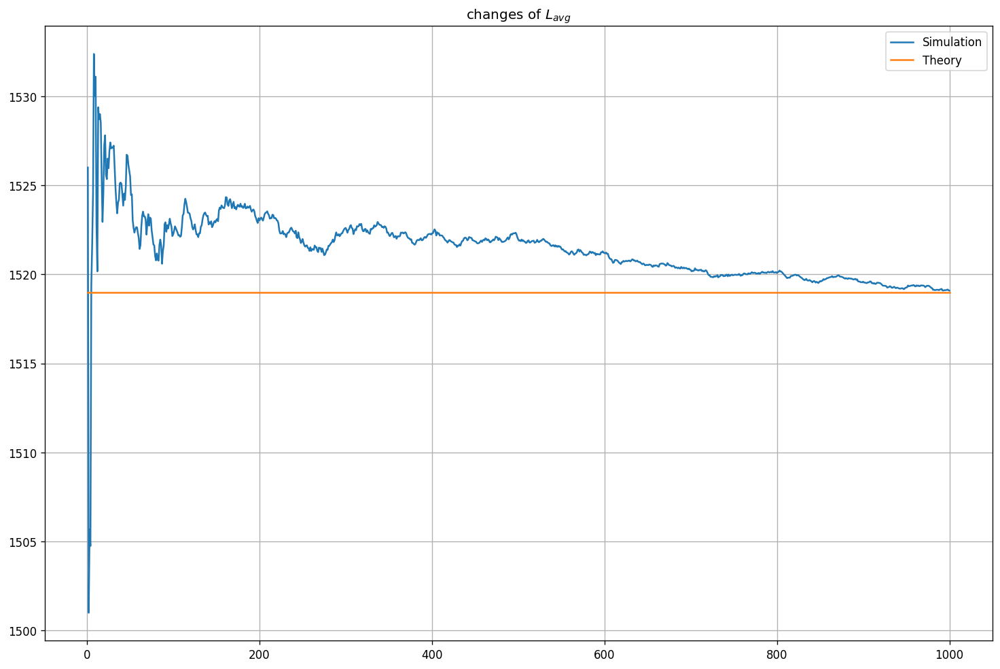

In [52]:
L_avg_theory = 28 * 28 * (1/2 + 2 * 1/4 + 3 * 1/8 + 4 * 1/16 + 5 * 1/32 + 5 * 1/32) * np.ones(n)

i = np.arange(1,n+1)
plt.figure(dpi=120, figsize=(15,10))
plt.plot(i, L_avg)
plt.plot(i, L_avg_theory)
plt.title(r"changes of $L_{avg}$")
plt.legend(["Simulation", "Theory"])
plt.grid()
plt.show()

As can be seen, the simululation shows that:
$$
\lim_{n\rightarrow \infty} L_{avg} \approx 1519 
$$
which is equal to the value which is obtained using theory.

---
## 5. Golomb Coding

### Encoder

In [54]:
def unary_encoder(n):
    '''gets an integer n as input and returns an unary encoded string of 0 and 1's'''
    return "1"*n + "0"

def golomb_encoder(x, m):
    '''gets integers x and m as its input and and returns an string G_m(x)'''
    q = x//m
    q_code = unary_encoder(q)
    r = x - q * m
    k = int(np.ceil(np.log2(m)))
    if (2**k == m):
        r_code = ('{0:0'+str(k)+'b}').format(int(r))
    else:
        c = 2**k - m
        if (r>=0 and r<c):
            r_code = ('{0:0'+str(k-1)+'b}').format(int(r))
        else:
            r_code = ('{0:0'+str(k)+'b}').format(int(r+c))
    code = q_code + r_code
    return code

def image_golomb_encoder(im, m):
    '''gets an image as its input and runs the golomb_encoder function of each of its pixels and returns a sequence
    of the encoded pixels'''
    N, M = im.shape
    encoded_seq = ''
    for i in range(N):
        for j in range(M):
            encoded_seq = encoded_seq + golomb_encoder(im[i,j], m)
    return encoded_seq

### Decoder

In [55]:
def unary_decoder(seq):
    '''gets an unary encoded sequence and return the value it represents'''
    n = seq.count("1")
    return n
    
def golomb_decoder(seq, m):
    '''gets an string which represents the golomb code of a number and returns it's decoded value ''' 
    q_code = ''
    r_code = ''
    finding_q = True
    for s in seq:
        if (finding_q):
            q_code = q_code + s
            if s == '0':
                finding_q = False
        else:
            r_code = r_code + s
    q = unary_decoder(q_code)
    r = int(r_code,2)
    k = int(np.ceil(np.log2(m)))
    if (2**k!=m and r >= 2**k - m):
        r = r - (2**k - m)
    x = q*m + r
    return x

def image_golomb_decoder(seq, m, im_shape):
    '''gets an encoded string which is a sequence of 0's and 1's, m and the desired shape of the image 
    and returns the image it is representing '''
    code = ''
    im_list = []
    k = int(np.ceil(np.log2(m)))
    if (2**k == m):
        finding_q = True
        r_counter = 0
        for s in seq:
            if (finding_q):
                code = code + s
                if s == '0':
                    finding_q = False
                    r_counter = 0
            else:
                if(r_counter < k):
                    code = code + s
                    r_counter = r_counter + 1
                    if (r_counter == k):
                        finding_q = True
                        im_list.append(golomb_decoder(code, m))
                        code = ''
    else:
        c = 2**k - m
        finding_q = True
        r_counter = 0
        r_seq = ''
        for i in range(len(seq)):
            s = seq[i]
            if (finding_q):
                code = code + s
                if s == '0':
                    finding_q = False
                    r_counter = 0
                    r_seq = ''
            else:
                if (r_counter < k-1):
                    code = code + s
                    r_counter = r_counter + 1
                    r_seq = r_seq + s
                    if (r_counter == (k-1) and i<len(seq)):
                        # checking if the length of r should be k or k-1
                        r_next = int(r_seq + seq[i+1], 2) - c
                        if (r_next < c):
                            finding_q = True
                            im_list.append(golomb_decoder(code,m))
                            code = ''
                else:
                    # this means that the length of r is k and this should be the end of the remainder sequence
                    code = code + s
                    im_list.append(golomb_decoder(code,m))
                    finding_q = True
                    code = ''
                
    im = np.array(im_list).reshape(im_shape)
    return im

For this question, the same image that has been used for question 1 is used again.

In [56]:
# loading image
im1 = np.array(Image.open("q1.jpg")).astype("double")
im1 = im1[:,:,0] * 299/1000 + im1[:,:,1] * 587/1000 + im1[:,:,2] * 114/1000
im1 = np.round_(im1).astype("uint8")

# calculating the size of the image (uncompressed) using the shape and the fact that it contains 8 bit per pixel
im_size = im1.shape[0] * im1.shape[1] * 8
print("The size of the image is:", im_size, "bits")

The size of the image is: 2768640 bits


In [57]:
# encoding the image with a random m between 2 to 32
m = int(np.random.uniform(low = 2,high = 33))
im_shape = im1.shape
im_encoded = image_golomb_encoder(im1, m)
encode_length = len(im_encoded)

print("Image encoded successfully with m = " + str(m) + " and a sequence length of " +  str(encode_length) + "bits")

# decoding the image and checking if there is any difference between the original and decoded images
im_decoded = image_golomb_decoder(im_encoded, m, im_shape)
if ((im1 == im_decoded).all()):
    print("The decoded image is exactly the same as the original image!")
else:
    print("The decoded image is different from the original image!")

Image encoded successfully with m = 24 and a sequence length of 3635591bits
The decoded image is exactly the same as the original image!


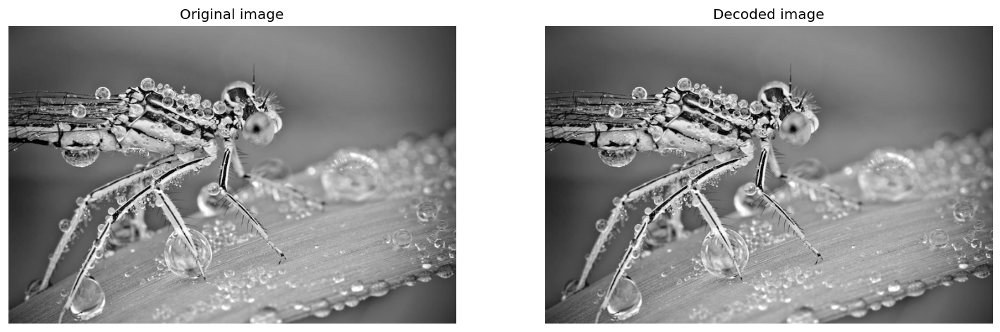

In [58]:
# plotting the original image and the decoded image
plt.figure(figsize=(15,10), dpi=120)
plt.subplot(1,2,1)
plt.imshow(im1, cmap="gray")
plt.axis("off")
plt.title("Original image")

plt.subplot(1,2,2)
plt.imshow(im_decoded, cmap="gray")
plt.axis("off")
plt.title("Decoded image")

plt.show()

In [59]:
## showing the proccess for a simpler array
arr = np.array([[5,2,12],[8,4,12],[2,2,9]])
print("The original array:\n")
print(arr)
encoded_arr = image_golomb_encoder(arr, 5)
print("\n\nEncoded sequence for the given array:")
print(encoded_arr)

decoded_arr = image_golomb_decoder(encoded_arr, 5, (3,3))
print("\n\nThe decoded array:\n")
print(decoded_arr)

The original array:

[[ 5  2 12]
 [ 8  4 12]
 [ 2  2  9]]


Encoded sequence for the given array:
1000010110101011001111101001001010111


The decoded array:

[[ 5  2 12]
 [ 8  4 12]
 [ 2  2  9]]
